In [1]:
# pip install 'scvi-tools==0.17.1'

In [2]:
import os
os.environ['PATH'] += os.pathsep + '/home/jupyter/.local/bin'

In [3]:
import scvi

Global seed set to 0


In [4]:
print(scvi.__version__)

0.17.1


# all_cell object and brain object integration

In [77]:
import pandas as pd
import numpy as np
import scanpy as sc #pip install scanpy
import anndata
import scipy

import sys,os
import scvi

In [78]:
import matplotlib
import seaborn as sns
from matplotlib import colors
import matplotlib.pyplot as plt
from matplotlib import rcParams
from matplotlib.pyplot import rc_context
from matplotlib.colors import LinearSegmentedColormap
from statsmodels.stats.multitest import multipletests

sc.logging.print_header()
sc.settings.verbosity = 3
sc.settings.set_figure_params(dpi=100, facecolor='white')

scanpy==1.9.6 anndata==0.9.2 umap==0.5.4 numpy==1.24.4 scipy==1.10.1 pandas==2.0.3 scikit-learn==1.3.2 statsmodels==0.14.0 igraph==0.11.2 pynndescent==0.5.10


In [79]:
pwd

'/home/jupyter/tmpmount/vasculature'

In [8]:
adata = sc.read_h5ad('/home/jupyter/tmpmount/vasculature/gdrive_data/ec_mural_cellbender_filtered.h5ad')

In [9]:
adata

AnnData object with n_obs × n_vars = 43838 × 36379
    obs: 'orig.ident', 'Sample', 'ec_clusters', 'mural_clusters', 'sub_clusters'
    var: 'gene_ids'

In [10]:
adata.obs['donor'] = adata.obs['Sample']

In [11]:
adata.var_names

Index(['MIR1302-2HG', 'FAM138A', 'OR4F5', 'AL627309.1', 'AL627309.3',
       'AL627309.2', 'AL627309.5', 'AL627309.4', 'AP006222.2', 'AL732372.1',
       ...
       'AC133551.1', 'AC136612.1', 'AC136616.1', 'AC136616.3', 'AC136616.2',
       'AC141272.1', 'AC023491.2', 'AC007325.1', 'AC007325.4', 'AC007325.2'],
      dtype='object', length=36379)

In [12]:
adata.obs['kit'] = '10x3prime_v3'

In [13]:
adata.layers['counts'] = adata.X.copy()

In [14]:
adata.obs['study'] = 'Winkler_et_al_2022'

In [15]:
adata.obs['organ_uni'] = 'brain'

In [16]:
adata

AnnData object with n_obs × n_vars = 43838 × 36379
    obs: 'orig.ident', 'Sample', 'ec_clusters', 'mural_clusters', 'sub_clusters', 'donor', 'kit', 'study', 'organ_uni'
    var: 'gene_ids'
    layers: 'counts'

In [17]:
adata.obs.rename(columns={'ec_clusters': 'Winkler_annotation_ec'}, inplace=True)
adata.obs.rename(columns={'mural_clusters': 'Winkler_annotation_mural'}, inplace=True)
adata.obs.rename(columns={'sub_clusters': 'Winkler_annotation_mural_fine'}, inplace=True)

In [18]:
adata

AnnData object with n_obs × n_vars = 43838 × 36379
    obs: 'orig.ident', 'Sample', 'Winkler_annotation_ec', 'Winkler_annotation_mural', 'Winkler_annotation_mural_fine', 'donor', 'kit', 'study', 'organ_uni'
    var: 'gene_ids'
    layers: 'counts'

In [19]:
adata.obs['Winkler_annotation'] = adata.obs['Winkler_annotation_ec'] 

In [20]:
adata.obs['Winkler_annotation']

ctrl085_L_GGTGTCGTCAACTGAC    Venous
ctrl085_L_TCATTCAAGACGCTCC      Art1
ctrl085_L_GTGTCCTTCCAGCCTT    Venous
ctrl085_L_GTAGGTTTCAGACCGC    Venous
ctrl085_L_GTAGAAATCATTCGTT    Venous
                               ...  
ctrl12_TCCTGCATCAAGATAG          NaN
ctrl12_GCAGCTGTCTGCTGAA          NaN
ctrl12_TCAGTTTTCTGTAACG          NaN
ctrl12_AGACAAAAGGATTTCC          NaN
ctrl12_TGTTGGAAGTAAGAGG          NaN
Name: Winkler_annotation, Length: 43838, dtype: category
Categories (6, object): ['Art1', 'Art2', 'Art3', 'Cap', 'Venous', 'Venule']

In [21]:
import pandas as pd

# Assuming adata is your DataFrame
adata.obs['Winkler_annotation'] = adata.obs['Winkler_annotation'].astype('category')
adata.obs['Winkler_annotation_mural_fine'] = adata.obs['Winkler_annotation_mural_fine'].astype('category')

# Create a mask for NaN values in 'Winkler_annotation'
mask = adata.obs['Winkler_annotation'].isna()

# Ensure categories match
combined_categories = set(adata.obs['Winkler_annotation'].cat.categories) | set(adata.obs['Winkler_annotation_mural_fine'].cat.categories)

# Reassign categories
adata.obs['Winkler_annotation'] = adata.obs['Winkler_annotation'].cat.set_categories(combined_categories)
adata.obs['Winkler_annotation_mural_fine'] = adata.obs['Winkler_annotation_mural_fine'].cat.set_categories(combined_categories)

# Fill missing values using the mask
adata.obs.loc[mask, 'Winkler_annotation'] = adata.obs['Winkler_annotation_mural_fine']

In [22]:
np.unique(adata.obs['Winkler_annotation'])

array(['Art1', 'Art2', 'Art3', 'Cap', 'FB1', 'FB2', 'FBMC1', 'FBMC2',
       'PC', 'SMC1', 'SMC2', 'SMC3', 'SMC4', 'SMC5', 'SMC6', 'SMC7',
       'Venous', 'Venule'], dtype=object)

In [67]:
adata.obs['Winkler_broad_annotation'] = adata.obs['Winkler_annotation']
np.unique(adata.obs['Winkler_broad_annotation'])

array(['Art1', 'Art2', 'Art3', 'Cap', 'FB1', 'FB2', 'FBMC1', 'FBMC2',
       'PC', 'SMC1', 'SMC2', 'SMC3', 'SMC4', 'SMC5', 'SMC6', 'SMC7',
       'Venous', 'Venule'], dtype=object)

In [68]:
adata.obs['Winkler_annotation_ec'] = adata.obs['Winkler_annotation_ec'].astype('category')
adata.obs['Winkler_annotation_ec']

ctrl085_L_GGTGTCGTCAACTGAC    Venous
ctrl085_L_TCATTCAAGACGCTCC      Art1
ctrl085_L_GTGTCCTTCCAGCCTT    Venous
ctrl085_L_GTAGGTTTCAGACCGC    Venous
ctrl085_L_GTAGAAATCATTCGTT    Venous
                               ...  
ctrl12_TCCTGCATCAAGATAG          NaN
ctrl12_GCAGCTGTCTGCTGAA          NaN
ctrl12_TCAGTTTTCTGTAACG          NaN
ctrl12_AGACAAAAGGATTTCC          NaN
ctrl12_TGTTGGAAGTAAGAGG          NaN
Name: Winkler_annotation_ec, Length: 43838, dtype: category
Categories (6, object): ['Art1', 'Art2', 'Art3', 'Cap', 'Venous', 'Venule']

In [69]:
# Replace 'Art1', 'Art2', 'Art3', 'Cap', 'Venous', 'Venule' with 'EC' in the 'Winkler_broad_ann' column
adata.obs['Winkler_broad_annotation'].replace({'Art1': 'EC', 'Art2': 'EC', 'Art3': 'EC', 'Cap': 'EC', 'Venous': 'EC', 'Venule': 'EC'}, inplace=True)

In [71]:
adata.obs['Winkler_broad_annotation'].replace({'PC':'mural', 'SMC1':'mural', 'SMC2':'mural', 'SMC3':'mural', 'SMC4':'mural', 'SMC5':'mural', 'SMC6':'mural', 'SMC7':'mural'}, inplace=True)

In [73]:
adata.obs['Winkler_broad_annotation'].replace({'FB1':'FB', 'FB2':'FB', 'FBMC1':'FBMC', 'FBMC2':'FBMC'}, inplace=True)

In [74]:
np.unique(adata.obs['Winkler_broad_annotation'])

array(['EC', 'FB', 'FBMC', 'mural'], dtype=object)

In [75]:
adata.obs['orig.ident'].value_counts()

orig.ident
ctrl099_21    16540
ctrl099_22    11631
ctrl086_1     10673
ctrl085_L      4055
ctrl085_S       594
ctrl12          345
Name: count, dtype: int64

In [25]:
adata.var_names

Index(['MIR1302-2HG', 'FAM138A', 'OR4F5', 'AL627309.1', 'AL627309.3',
       'AL627309.2', 'AL627309.5', 'AL627309.4', 'AP006222.2', 'AL732372.1',
       ...
       'AC133551.1', 'AC136612.1', 'AC136616.1', 'AC136616.3', 'AC136616.2',
       'AC141272.1', 'AC023491.2', 'AC007325.1', 'AC007325.4', 'AC007325.2'],
      dtype='object', length=36379)

In [26]:
# Annotate mitochondrial genes
adata.var['mt'] = adata.var_names.str.startswith('MT-')

In [27]:
adata.var['mt'].isna().sum()

0

In [28]:
adata.var['mt']

MIR1302-2HG    False
FAM138A        False
OR4F5          False
AL627309.1     False
AL627309.3     False
               ...  
AC141272.1     False
AC023491.2     False
AC007325.1     False
AC007325.4     False
AC007325.2     False
Name: mt, Length: 36379, dtype: bool

In [29]:
adata.var['mt'].value_counts()

mt
False    36366
True        13
Name: count, dtype: int64

In [30]:
adata.X[1:10, 1:10].toarray()

array([[0, 0, 0, 0, 0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0, 0, 0, 0, 0]], dtype=uint32)

In [31]:
sc.pp.calculate_qc_metrics(adata, qc_vars=['mt'], inplace=True)

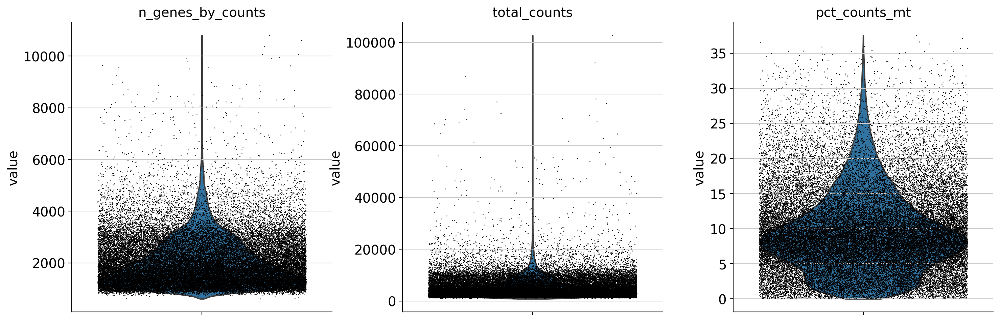

In [32]:
sc.pl.violin(adata, ['n_genes_by_counts', 'total_counts', 'pct_counts_mt'],
             jitter=0.4, multi_panel=True)

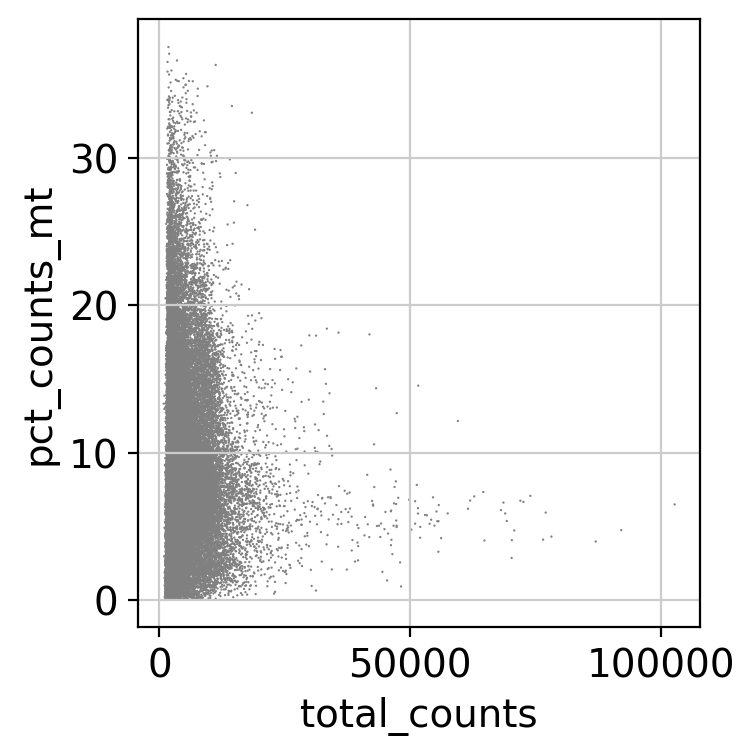

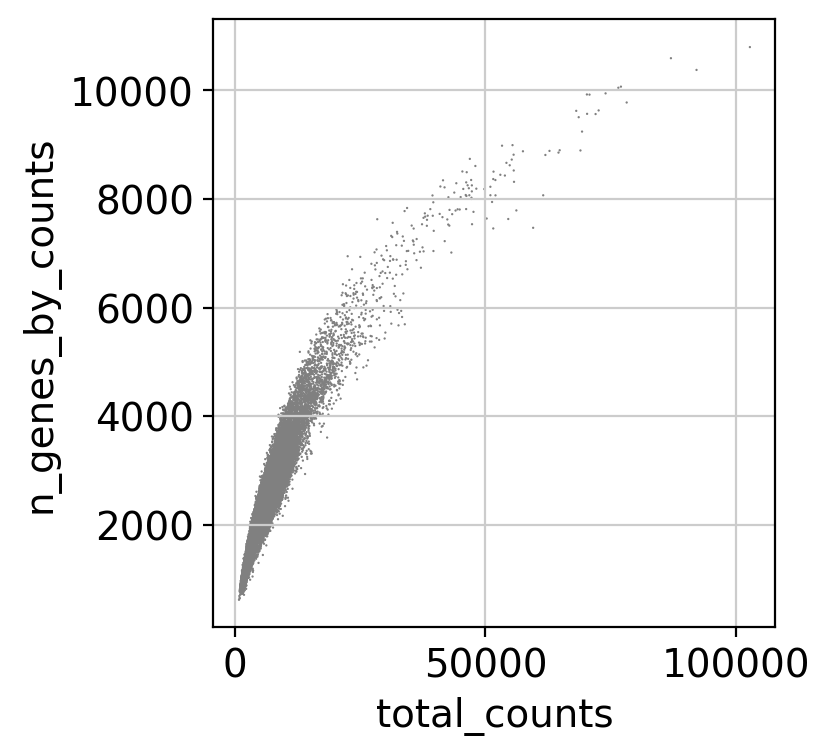

In [33]:
sc.pl.scatter(adata, x='total_counts', y='pct_counts_mt')
sc.pl.scatter(adata, x='total_counts', y='n_genes_by_counts')

In [34]:
adata.var['rb'] = adata.var_names.str.startswith('RPS')  # annotate the group of ribosomal genes as 'ribo'
sc.pp.calculate_qc_metrics(adata, qc_vars=['rb'], percent_top=None, log1p=False, inplace=True)

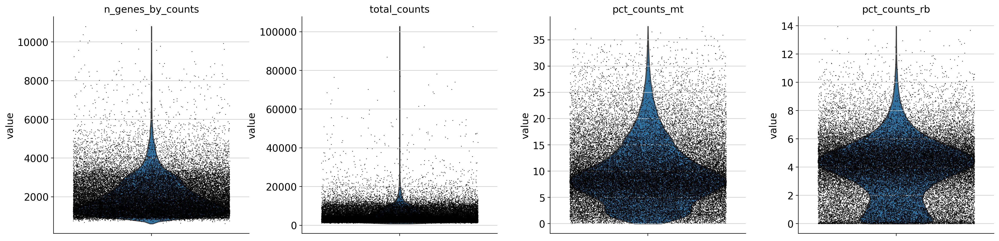

In [35]:
sc.pl.violin(adata, ['n_genes_by_counts', 'total_counts', 'pct_counts_mt','pct_counts_rb'],
             jitter=0.4, multi_panel=True)

In [36]:
bdata = sc.read_h5ad('/home/jupyter/tmpmount/vasculature/gdrive_data/adult19_all_cells_raw_immune_20230615.h5ad')

In [37]:
bdata

AnnData object with n_obs × n_vars = 758414 × 31402
    obs: 'id', 'organ', 'donor', 'kit', 'sorting', 'location', 'age', 'gender', 'dissociation', 'scrublet_score', 'doublet_bh_pval', 'published_annotation', 'HCA', 'published_annotation_skin', 'batch', 'study', 'cell_ontology_class', 'free_annotation', 'compartment', 'age2', 'barcode', 'concat_sample_no', 'Population ', 'hospital_id', 'Organ', 'Cell_category', 'Predicted_labels_CellTypist', 'Majority_voting_CellTypist', 'Majority_voting_CellTypist_high', 'doublet_pval', 'Project', 'broad_celltype', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_rb', 'pct_counts_rb', 'int_or_ext', 'original_index', 'ann_vas_2', 'index_uni', 'leiden_scVI', 'ann_vas_1', 'ann_vas_3', 'ann_vas_3_copy', 'ann_vas_2_copy', 'organ_uni', 'ann_compartment'
    var: 'ENSG_id', 'gene_name_33538', 'gene_name_33694', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'rb', 'gene_names_hg_v1.2-0-

In [38]:
bdata.X[1:10, 1:10].toarray()

array([[0.        , 1.1626364 , 0.        , 0.        , 0.48741445,
        0.        , 0.        , 0.        , 0.        ],
       [0.29222828, 0.51808965, 0.        , 0.        , 0.        ,
        0.29222828, 0.51808965, 0.        , 0.        ],
       [0.29952887, 0.        , 0.        , 0.        , 0.        ,
        0.5297137 , 0.29952887, 0.        , 0.        ],
       [0.        , 0.530548  , 0.        , 0.        , 0.530548  ,
        0.        , 0.30005404, 0.        , 0.        ],
       [0.        , 0.30686444, 0.        , 0.        , 0.        ,
        0.73115087, 0.        , 0.        , 0.        ],
       [0.        , 0.3275301 , 0.        , 0.        , 0.        ,
        0.        , 0.        , 0.        , 0.        ],
       [0.        , 0.7953048 , 0.        , 0.        , 0.5933696 ,
        0.34006482, 0.34006482, 0.34006482, 0.        ],
       [0.        , 0.34961063, 0.        , 0.        , 0.        ,
        0.        , 0.        , 0.        , 0.        ],


In [38]:
bdata.X[1:10, 1:10].toarray()

array([[0.        , 1.1626364 , 0.        , 0.        , 0.48741445,
        0.        , 0.        , 0.        , 0.        ],
       [0.29222828, 0.51808965, 0.        , 0.        , 0.        ,
        0.29222828, 0.51808965, 0.        , 0.        ],
       [0.29952887, 0.        , 0.        , 0.        , 0.        ,
        0.5297137 , 0.29952887, 0.        , 0.        ],
       [0.        , 0.530548  , 0.        , 0.        , 0.530548  ,
        0.        , 0.30005404, 0.        , 0.        ],
       [0.        , 0.30686444, 0.        , 0.        , 0.        ,
        0.73115087, 0.        , 0.        , 0.        ],
       [0.        , 0.3275301 , 0.        , 0.        , 0.        ,
        0.        , 0.        , 0.        , 0.        ],
       [0.        , 0.7953048 , 0.        , 0.        , 0.5933696 ,
        0.34006482, 0.34006482, 0.34006482, 0.        ],
       [0.        , 0.34961063, 0.        , 0.        , 0.        ,
        0.        , 0.        , 0.        , 0.        ],


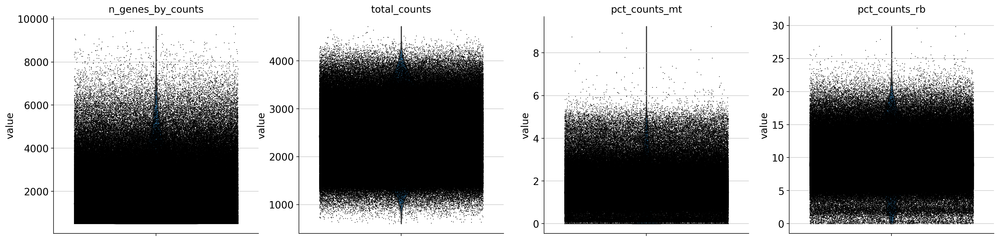

In [39]:
sc.pl.violin(bdata, ['n_genes_by_counts', 'total_counts', 'pct_counts_mt','pct_counts_rb'],
             jitter=0.4, multi_panel=True)

# copy bdata.layers.counts before calculating the percentage of mito exprressing cells! 

In [40]:
bdata.X = bdata.layers['counts'].copy()

In [41]:
bdata.X[1:10, 1:10].toarray()

array([[0., 7., 0., 0., 2., 0., 0., 0., 0.],
       [1., 2., 0., 0., 0., 1., 2., 0., 0.],
       [1., 0., 0., 0., 0., 2., 1., 0., 0.],
       [0., 2., 0., 0., 2., 0., 1., 0., 0.],
       [0., 1., 0., 0., 0., 3., 0., 0., 0.],
       [0., 1., 0., 0., 0., 0., 0., 0., 0.],
       [0., 3., 0., 0., 2., 1., 1., 1., 0.],
       [0., 1., 0., 0., 0., 0., 0., 0., 0.],
       [0., 3., 0., 0., 0., 8., 2., 0., 0.]])

In [42]:
np.unique(bdata.obs.ann_compartment)

array(['B cells', 'Endothelial cells', 'Epithelial cells', 'Fibroblasts',
       'Mural cells', 'Myeloid cells', 'Satellite cells',
       'T cells/NKs/ILCs'], dtype=object)

In [43]:
bdata.var['mt'] = bdata.var_names.str.startswith('MT-')  # annotate the group of mitochondrial genes as 'mt'
sc.pp.calculate_qc_metrics(bdata, qc_vars=['mt'], percent_top=None, log1p=False, inplace=True)

In [44]:
bdata.var['rb'] = bdata.var_names.str.startswith('RPS')  # annotate the group of ribosomal genes as 'ribo'
sc.pp.calculate_qc_metrics(bdata, qc_vars=['rb'], percent_top=None, log1p=False, inplace=True)

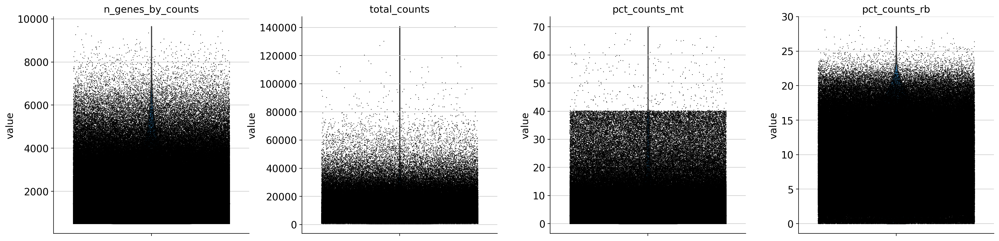

In [45]:
sc.pl.violin(bdata, ['n_genes_by_counts', 'total_counts', 'pct_counts_mt','pct_counts_rb'],
             jitter=0.4, multi_panel=True)

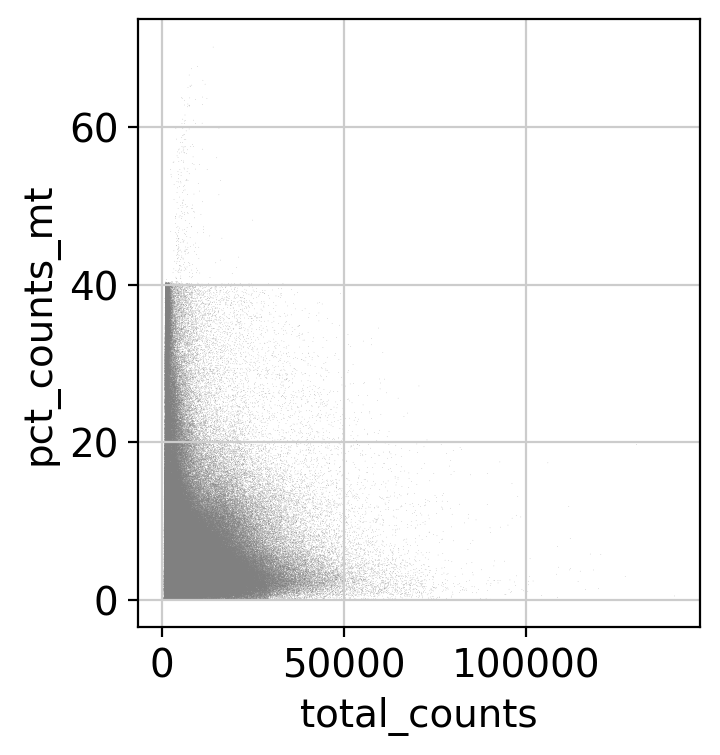

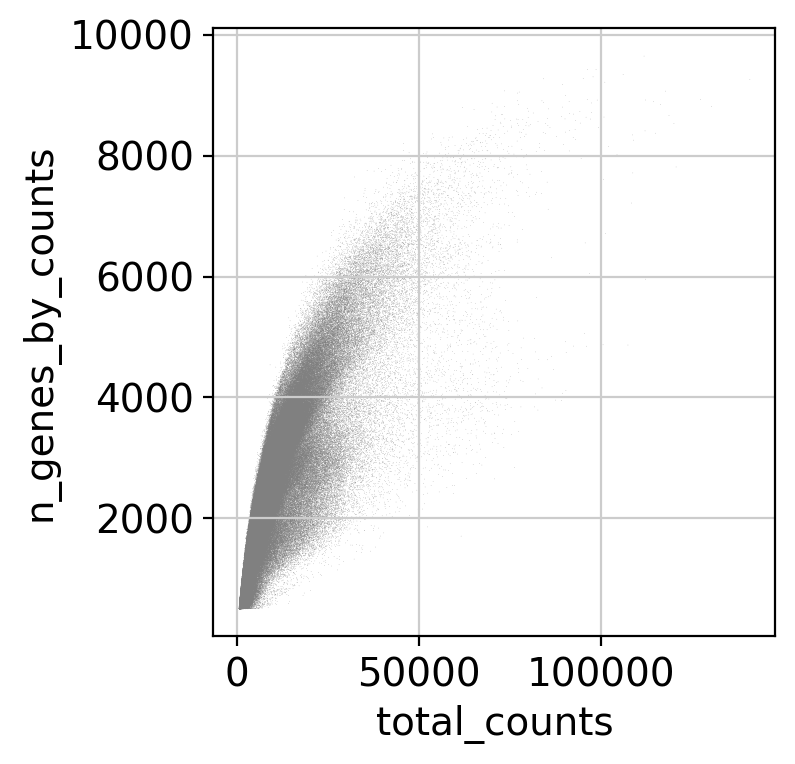

In [46]:
sc.pl.scatter(bdata, x='total_counts', y='pct_counts_mt')
sc.pl.scatter(bdata, x='total_counts', y='n_genes_by_counts')

In [47]:
bdata

AnnData object with n_obs × n_vars = 758414 × 31402
    obs: 'id', 'organ', 'donor', 'kit', 'sorting', 'location', 'age', 'gender', 'dissociation', 'scrublet_score', 'doublet_bh_pval', 'published_annotation', 'HCA', 'published_annotation_skin', 'batch', 'study', 'cell_ontology_class', 'free_annotation', 'compartment', 'age2', 'barcode', 'concat_sample_no', 'Population ', 'hospital_id', 'Organ', 'Cell_category', 'Predicted_labels_CellTypist', 'Majority_voting_CellTypist', 'Majority_voting_CellTypist_high', 'doublet_pval', 'Project', 'broad_celltype', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_rb', 'pct_counts_rb', 'int_or_ext', 'original_index', 'ann_vas_2', 'index_uni', 'leiden_scVI', 'ann_vas_1', 'ann_vas_3', 'ann_vas_3_copy', 'ann_vas_2_copy', 'organ_uni', 'ann_compartment'
    var: 'ENSG_id', 'gene_name_33538', 'gene_name_33694', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'rb', 'gene_names_hg_v1.2-0-

# concatenate the objects

In [76]:
# concatenate the two objects
cdata = adata.concatenate(bdata, join='inner', batch_key=None, index_unique=None)
cdata

/opt/conda/envs/scvi/lib/python3.8/site-packages/anndata/_core/anndata.py:1763: FutureWarning: The AnnData.concatenate method is deprecated in favour of the anndata.concat function. Please use anndata.concat instead.

See the tutorial for concat at: https://anndata.readthedocs.io/en/latest/concatenation.html
  warnings.warn(


AnnData object with n_obs × n_vars = 802252 × 31301
    obs: 'orig.ident', 'Sample', 'Winkler_annotation_ec', 'Winkler_annotation_mural', 'Winkler_annotation_mural_fine', 'donor', 'kit', 'study', 'organ_uni', 'Winkler_annotation', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_rb', 'pct_counts_rb', 'Winkler_broad_annotation', 'id', 'organ', 'sorting', 'location', 'age', 'gender', 'dissociation', 'scrublet_score', 'doublet_bh_pval', 'published_annotation', 'HCA', 'published_annotation_skin', 'batch', 'cell_ontology_class', 'free_annotation', 'compartment', 'age2', 'barcode', 'concat_sample_no', 'Population ', 'hospital_id', 'Organ', 'Cell_category', 'Predicted_labels_CellTypist', 'Majority_voting_CellTypist', 'Majority_voting_CellTypist_high', 'doublet_p

In [77]:
cdata.var_names

Index(['MIR1302-2HG', 'FAM138A', 'OR4F5', 'AL627309.1', 'AL627309.3',
       'AL627309.2', 'AL627309.4', 'AL732372.1', 'AC114498.1', 'AL669831.2',
       ...
       'MT-CO2', 'MT-ATP8', 'MT-ATP6', 'MT-CO3', 'MT-ND3', 'MT-ND4L', 'MT-ND4',
       'MT-ND5', 'MT-ND6', 'MT-CYB'],
      dtype='object', length=31301)

In [78]:
adata = cdata

In [79]:
adata

AnnData object with n_obs × n_vars = 802252 × 31301
    obs: 'orig.ident', 'Sample', 'Winkler_annotation_ec', 'Winkler_annotation_mural', 'Winkler_annotation_mural_fine', 'donor', 'kit', 'study', 'organ_uni', 'Winkler_annotation', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_rb', 'pct_counts_rb', 'Winkler_broad_annotation', 'id', 'organ', 'sorting', 'location', 'age', 'gender', 'dissociation', 'scrublet_score', 'doublet_bh_pval', 'published_annotation', 'HCA', 'published_annotation_skin', 'batch', 'cell_ontology_class', 'free_annotation', 'compartment', 'age2', 'barcode', 'concat_sample_no', 'Population ', 'hospital_id', 'Organ', 'Cell_category', 'Predicted_labels_CellTypist', 'Majority_voting_CellTypist', 'Majority_voting_CellTypist_high', 'doublet_p

In [80]:
adata.X[1:10, 1:10].toarray()

array([[0., 0., 0., 0., 0., 0., 0., 0., 0.],
       [0., 0., 0., 0., 0., 0., 0., 0., 0.],
       [0., 0., 0., 0., 0., 0., 0., 0., 0.],
       [0., 0., 0., 0., 0., 0., 0., 0., 0.],
       [0., 0., 0., 0., 0., 0., 0., 0., 0.],
       [0., 0., 0., 0., 0., 0., 0., 0., 0.],
       [0., 0., 0., 0., 0., 0., 0., 0., 0.],
       [0., 0., 0., 0., 0., 0., 0., 0., 0.],
       [0., 0., 0., 0., 0., 0., 0., 0., 0.]])

In [81]:
adata.obs['total_counts_mt']

ctrl085_L_GGTGTCGTCAACTGAC                 3805.0
ctrl085_L_TCATTCAAGACGCTCC                 2611.0
ctrl085_L_GTGTCCTTCCAGCCTT                 3796.0
ctrl085_L_GTAGGTTTCAGACCGC                 3062.0
ctrl085_L_GTAGAAATCATTCGTT                 1998.0
                                            ...  
AGTGAGGAGGACAGAA_Human_colon_16S8002623       8.0
ACTGCTCTCCAGAAGG_Human_colon_16S8002623      98.0
CTCTAATGTCCCTACT_Human_colon_16S8002623     118.0
CATATTCGTACCGTAT_Human_colon_16S8002623      28.0
CACAGTAAGGGTCTCC_Human_colon_16S8002623      25.0
Name: total_counts_mt, Length: 802252, dtype: float64

In [82]:
adata.obs['pct_counts_mt']

ctrl085_L_GGTGTCGTCAACTGAC                  6.185785
ctrl085_L_TCATTCAAGACGCTCC                  4.029508
ctrl085_L_GTGTCCTTCCAGCCTT                  6.959774
ctrl085_L_GTAGGTTTCAGACCGC                  5.744194
ctrl085_L_GTAGAAATCATTCGTT                  2.845181
                                             ...    
AGTGAGGAGGACAGAA_Human_colon_16S8002623     1.034929
ACTGCTCTCCAGAAGG_Human_colon_16S8002623    12.564103
CTCTAATGTCCCTACT_Human_colon_16S8002623    15.070243
CATATTCGTACCGTAT_Human_colon_16S8002623     3.612903
CACAGTAAGGGTCTCC_Human_colon_16S8002623     3.597122
Name: pct_counts_mt, Length: 802252, dtype: float64

In [83]:
adata.obs['pct_counts_rb']

ctrl085_L_GGTGTCGTCAACTGAC                 2.983158
ctrl085_L_TCATTCAAGACGCTCC                 3.333488
ctrl085_L_GTGTCCTTCCAGCCTT                 3.789740
ctrl085_L_GTAGGTTTCAGACCGC                 5.213297
ctrl085_L_GTAGAAATCATTCGTT                 5.409831
                                             ...   
AGTGAGGAGGACAGAA_Human_colon_16S8002623    1.164295
ACTGCTCTCCAGAAGG_Human_colon_16S8002623    2.564103
CTCTAATGTCCCTACT_Human_colon_16S8002623    3.320562
CATATTCGTACCGTAT_Human_colon_16S8002623    3.741935
CACAGTAAGGGTCTCC_Human_colon_16S8002623    4.028777
Name: pct_counts_rb, Length: 802252, dtype: float64

In [84]:
np.unique(adata.obs['pct_counts_mt'])

array([0.00000000e+00, 3.54584781e-03, 3.81184722e-03, ...,
       6.73842061e+01, 6.76965154e+01, 7.01406062e+01])

In [85]:
np.unique(adata.obs['pct_counts_rb'])

array([0.00000000e+00, 1.37343771e-02, 1.40845070e-02, ...,
       2.80180944e+01, 2.80753283e+01, 2.85761810e+01])

In [86]:
adata.obs['donor'] = adata.obs['donor'].astype(str)

In [87]:
adata.obs.donor.value_counts()

donor
TSP14     96990
TSP2      67411
A34       42108
A59       33979
A13       32155
          ...  
CTRL12      345
TxK3        271
RCC3        257
A47         202
621B        104
Name: count, Length: 67, dtype: int64

In [88]:
adata.obs['study'] = adata.obs['study'].astype(str)
np.unique(adata.obs.study)

array(['TS', 'Winkler_et_al_2022', 'hca', 'liver'], dtype=object)

In [89]:
np.unique(adata.obs.kit)

array(['10X', '10x3prime_v2', '10x3prime_v3', '10x5prime', '10x5prime_v1',
       '10x5prime_v2', '10x_3prime'], dtype=object)

In [90]:
adata.X[1:10,1:10]

<9x9 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row format>

In [91]:
adata.layers['counts'][1:10,1:10]

<9x9 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row format>

In [92]:
# filtering and normalisation

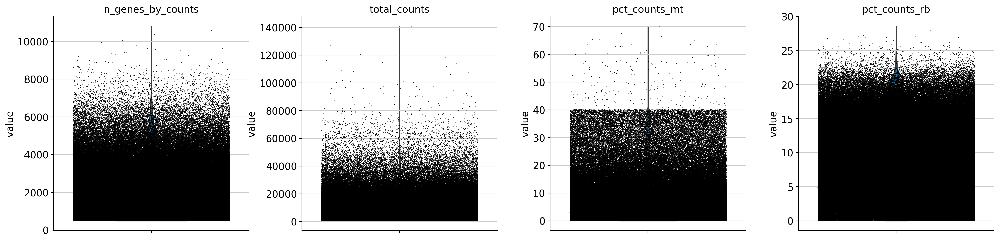

In [93]:
sc.pl.violin(adata, ['n_genes_by_counts', 'total_counts', 'pct_counts_mt','pct_counts_rb'],
             jitter=0.4, multi_panel=True)

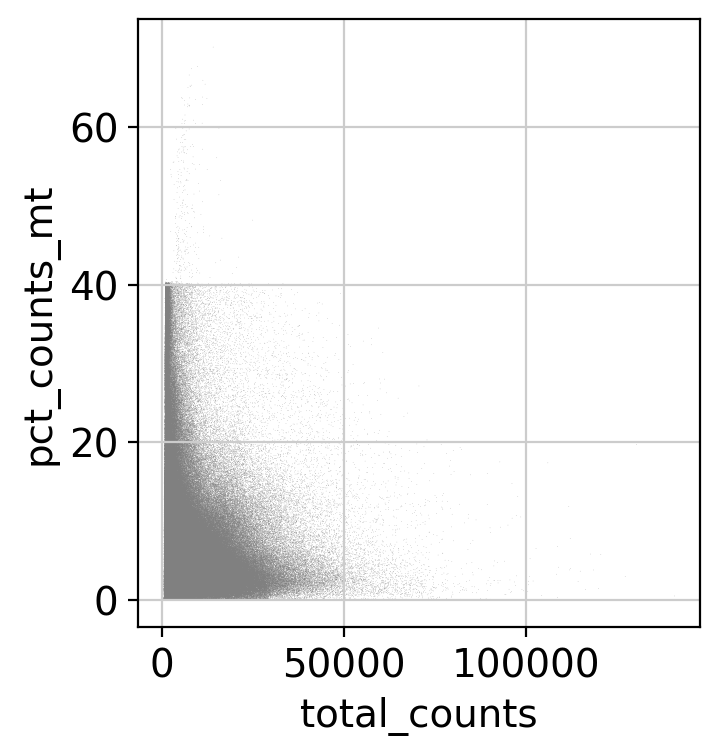

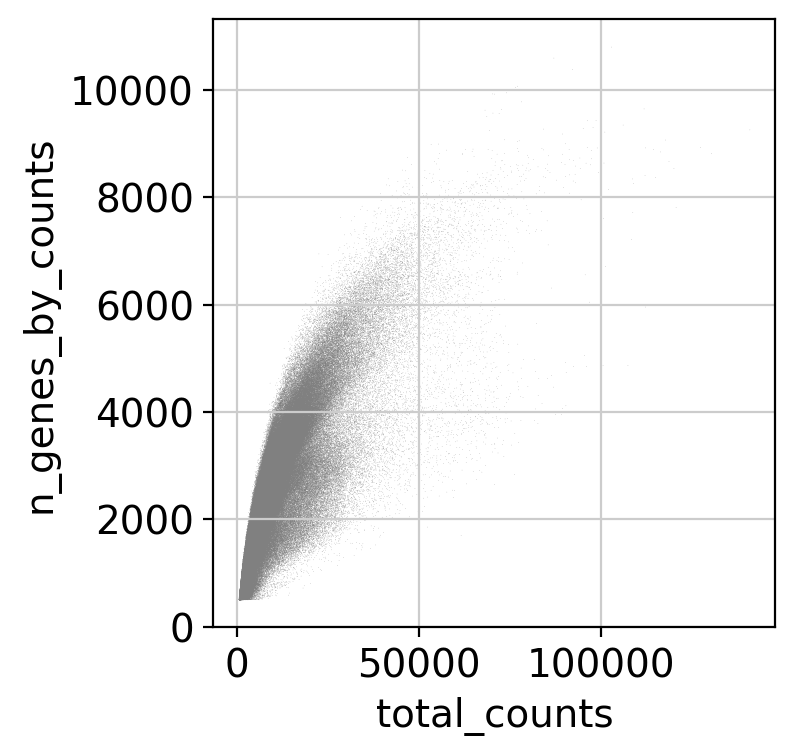

In [94]:
sc.pl.scatter(adata, x='total_counts', y='pct_counts_mt')
sc.pl.scatter(adata, x='total_counts', y='n_genes_by_counts')

In [95]:
sc.pp.filter_cells(adata, min_genes=300)
sc.pp.filter_genes(adata, min_cells=3)

filtered out 1280 genes that are detected in less than 3 cells


In [96]:
adata = adata[adata.obs.pct_counts_mt < 40, :]

In [97]:
adata

View of AnnData object with n_obs × n_vars = 801715 × 30021
    obs: 'orig.ident', 'Sample', 'Winkler_annotation_ec', 'Winkler_annotation_mural', 'Winkler_annotation_mural_fine', 'donor', 'kit', 'study', 'organ_uni', 'Winkler_annotation', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_rb', 'pct_counts_rb', 'Winkler_broad_annotation', 'id', 'organ', 'sorting', 'location', 'age', 'gender', 'dissociation', 'scrublet_score', 'doublet_bh_pval', 'published_annotation', 'HCA', 'published_annotation_skin', 'batch', 'cell_ontology_class', 'free_annotation', 'compartment', 'age2', 'barcode', 'concat_sample_no', 'Population ', 'hospital_id', 'Organ', 'Cell_category', 'Predicted_labels_CellTypist', 'Majority_voting_CellTypist', 'Majority_voting_CellTypist_high', 'd

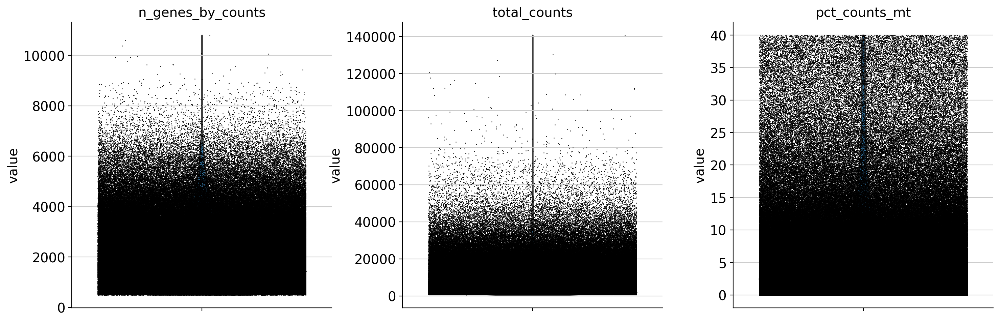

In [98]:
sc.pl.violin(adata, ['n_genes_by_counts', 'total_counts', 'pct_counts_mt'],
             jitter=0.4, multi_panel=True)

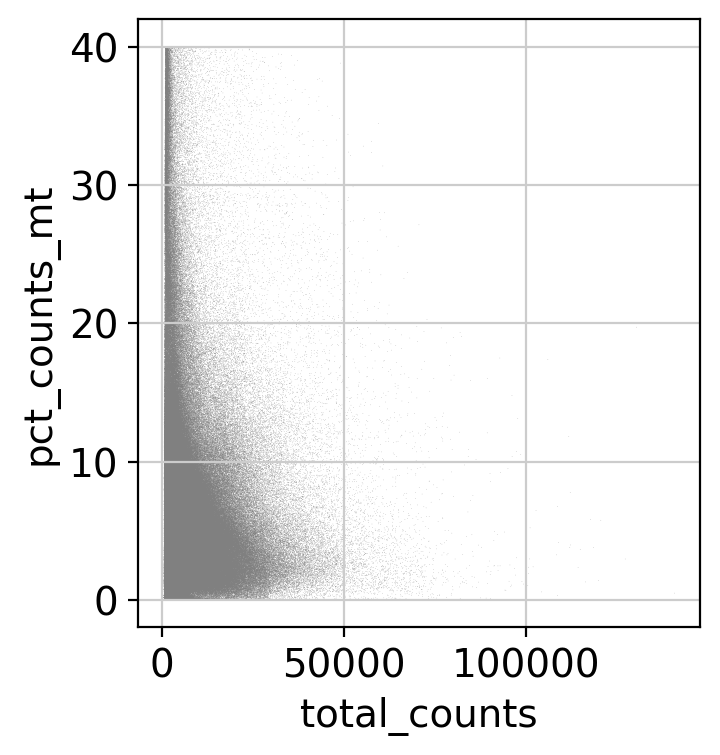

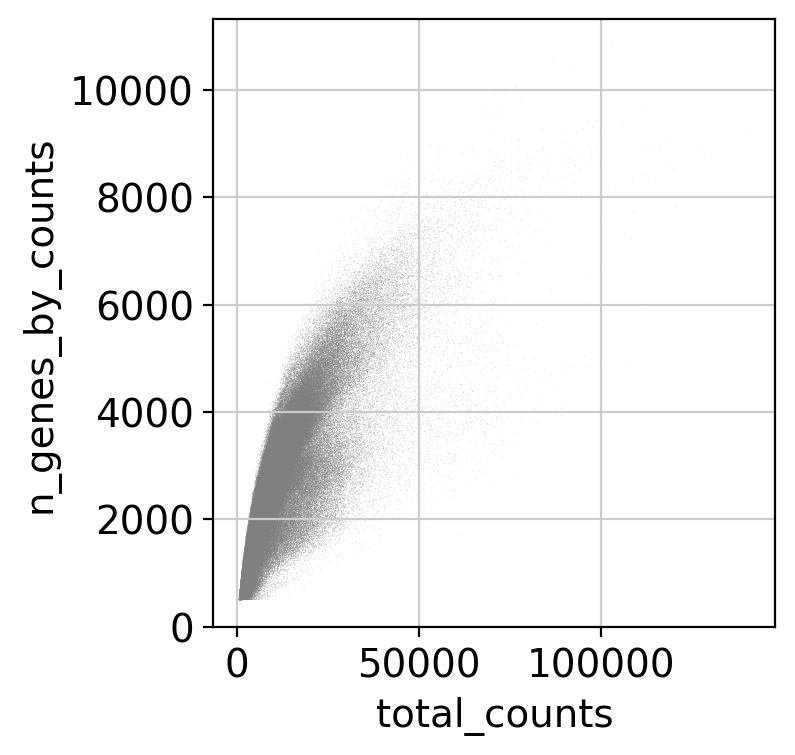

In [99]:
sc.pl.scatter(adata, x='total_counts', y='pct_counts_mt')
sc.pl.scatter(adata, x='total_counts', y='n_genes_by_counts')

## scvi with 5000 genes and layers = 2

In [101]:
sc.pp.highly_variable_genes(
    adata,
    flavor="seurat_v3",
    n_top_genes=5000,
    layer="counts",
    subset = False, 
    batch_key="study")
scvi.model.SCVI.setup_anndata(
    adata, 
    layer="counts", 
    batch_key="donor", 
    categorical_covariate_keys=['study','kit'], 
    continuous_covariate_keys=['total_counts', 'n_genes_by_counts','pct_counts_mt', 'pct_counts_rb'] #,'score_stress_genes''score_stress_genes' 'pct_counts_mt', 'pct_counts_rb','score_stress_genes'
)
vae = scvi.model.SCVI(adata, n_layers=2, n_latent=30) #, n_latent=30
#scvi.data.view_anndata_setup(adata)
vae
vae.train()
adata.obsm["X_scVI"] = vae.get_latent_representation()
adata.X.shape
sc.pp.neighbors(adata, use_rep="X_scVI")

If you pass `n_top_genes`, all cutoffs are ignored.
extracting highly variable genes


/opt/conda/envs/scvi/lib/python3.8/site-packages/scanpy/preprocessing/_highly_variable_genes.py:148: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns['hvg'] = {'flavor': 'seurat_v3'}


--> added
    'highly_variable', boolean vector (adata.var)
    'highly_variable_rank', float vector (adata.var)
    'means', float vector (adata.var)
    'variances', float vector (adata.var)
    'variances_norm', float vector (adata.var)


No GPU/TPU found, falling back to CPU. (Set TF_CPP_MIN_LOG_LEVEL=0 and rerun for more info.)
/opt/conda/envs/scvi/lib/python3.8/site-packages/scvi/model/base/_training_mixin.py:67: UserWarning: max_epochs=10 is less than n_epochs_kl_warmup=400. The max_kl_weight will not be reached during training.
  warnings.warn(
GPU available: True, used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Epoch 10/10: 100%|██████████| 10/10 [26:20<00:00, 158.06s/it, loss=5.5e+03, v_num=1] 
computing neighbors
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:01:55)


In [102]:
sc.tl.umap(adata)

computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:13:12)


In [103]:
adata

AnnData object with n_obs × n_vars = 801715 × 30021
    obs: 'orig.ident', 'Sample', 'Winkler_annotation_ec', 'Winkler_annotation_mural', 'Winkler_annotation_mural_fine', 'donor', 'kit', 'study', 'organ_uni', 'Winkler_annotation', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_rb', 'pct_counts_rb', 'Winkler_broad_annotation', 'id', 'organ', 'sorting', 'location', 'age', 'gender', 'dissociation', 'scrublet_score', 'doublet_bh_pval', 'published_annotation', 'HCA', 'published_annotation_skin', 'batch', 'cell_ontology_class', 'free_annotation', 'compartment', 'age2', 'barcode', 'concat_sample_no', 'Population ', 'hospital_id', 'Organ', 'Cell_category', 'Predicted_labels_CellTypist', 'Majority_voting_CellTypist', 'Majority_voting_CellTypist_high', 'doublet_p

/opt/conda/envs/scvi/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/opt/conda/envs/scvi/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/opt/conda/envs/scvi/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/opt/conda/envs/scvi/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/opt/conda/envs/scvi/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


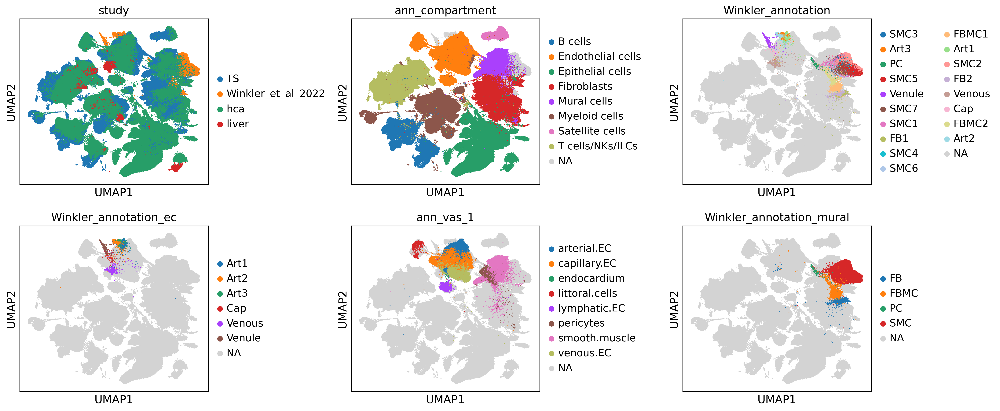

In [104]:
sc.settings.set_figure_params(dpi=150, facecolor='white')
sc.pl.umap(adata, color = ['study', 'ann_compartment', 'Winkler_annotation', 'Winkler_annotation_ec', 'ann_vas_1', 'Winkler_annotation_mural'], wspace = 0.6, ncols = 3, size = 5)

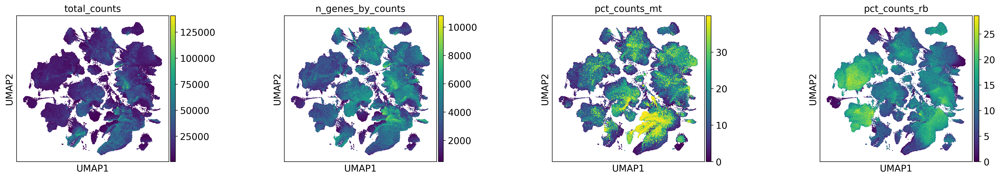

In [105]:
sc.pl.umap(adata, color = ['total_counts', 'n_genes_by_counts','pct_counts_mt', 'pct_counts_rb'], wspace = 0.6, ncols = 4, size = 5)

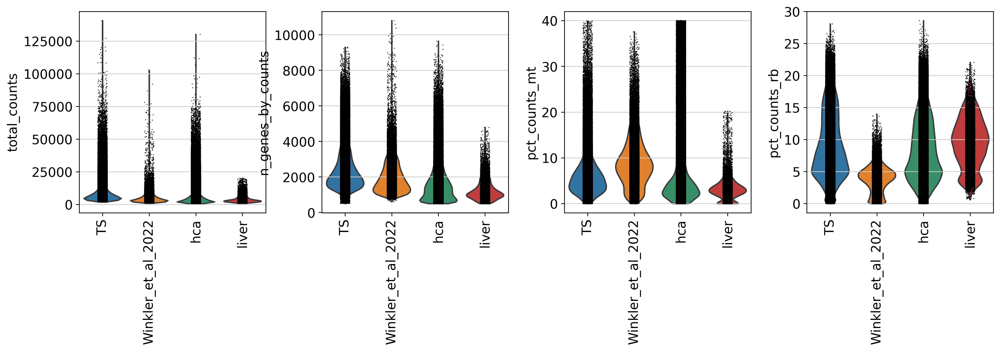

In [106]:
sc.pl.violin(adata, keys=['total_counts', 'n_genes_by_counts','pct_counts_mt', 'pct_counts_rb'], groupby='study', rotation=90)

In [107]:
adata.obs['brain_18_org_vas_annotation'] = adata.obs['ann_compartment']

In [108]:
# Assuming adata is your DataFrame
adata.obs['brain_18_org_vas_annotation'] = adata.obs['brain_18_org_vas_annotation'].astype('category')
adata.obs['Winkler_broad_annotation'] = adata.obs['Winkler_broad_annotation'].astype('category')

# Create a mask for NaN values in 'Winkler_annotation'
mask = adata.obs['brain_18_org_vas_annotation'].isna()

# Ensure categories match
combined_categories = set(adata.obs['brain_18_org_vas_annotation'].cat.categories) | set(adata.obs['Winkler_broad_annotation'].cat.categories)

# Reassign categories
adata.obs['brain_18_org_vas_annotation'] = adata.obs['brain_18_org_vas_annotation'].cat.set_categories(combined_categories)
adata.obs['Winkler_broad_annotation'] = adata.obs['Winkler_broad_annotation'].cat.set_categories(combined_categories)

# Fill missing values using the mask
adata.obs.loc[mask, 'brain_18_org_vas_annotation'] = adata.obs['Winkler_broad_annotation']

/opt/conda/envs/scvi/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


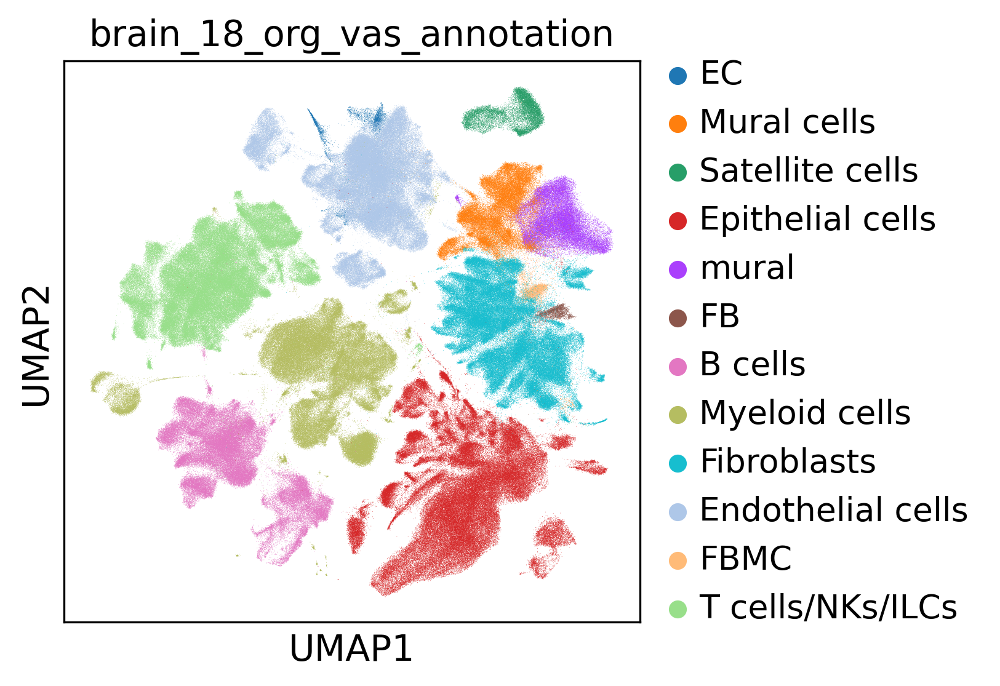

In [109]:
sc.pl.umap(adata, color= [ 'brain_18_org_vas_annotation'])

/opt/conda/envs/scvi/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/opt/conda/envs/scvi/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


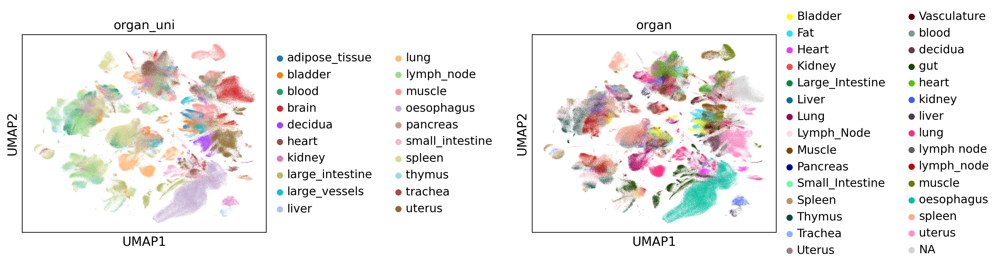

In [9]:
sc.pl.umap(adata, color= [ 'organ_uni', 'organ'], wspace = 0.9)

In [23]:
sc.tl.leiden(adata, resolution = 1, key_added = 'leiden_res_1')

running Leiden clustering
    finished: found 63 clusters and added
    'leiden_res_1', the cluster labels (adata.obs, categorical) (0:08:19)


/opt/conda/envs/scvi/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


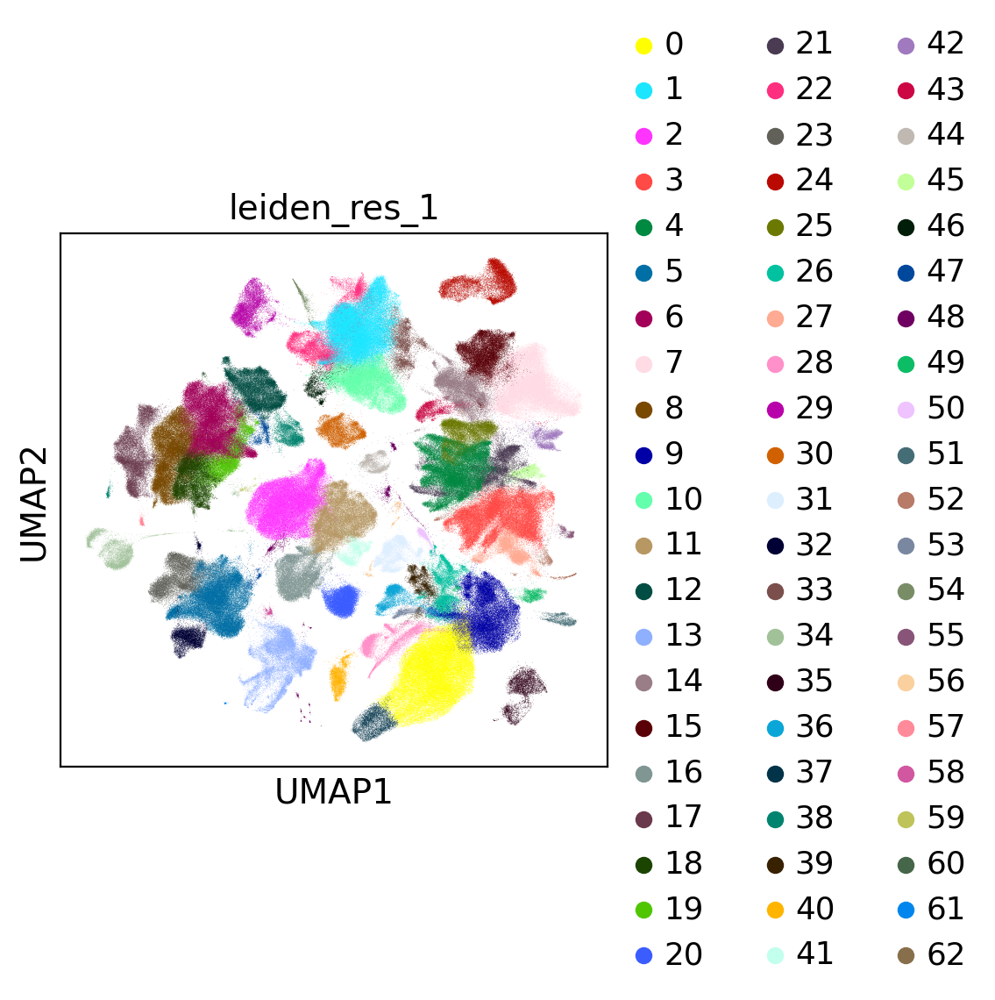

In [24]:
sc.pl.umap(adata, color='leiden_res_1')

In [25]:
pd.crosstab (adata.obs['leiden_res_0.5'], adata.obs['brain_18_org_vas_annotation'])

brain_18_org_vas_annotation,EC,Mural cells,Satellite cells,Epithelial cells,mural,FB,B cells,Myeloid cells,Fibroblasts,Endothelial cells,FBMC,T cells/NKs/ILCs
leiden_res_0.5,,,,,,,,,,,,
0,0,1,0,53199,0,0,0,3,2,0,0,0
1,135,26,1,10,0,1,0,71,39,50037,2,14
2,0,0,0,1,0,0,18,41965,0,4,0,47
3,0,149,1,55,1,29,1,13,39673,2,5,5
4,0,27,0,1,0,51,0,2,38525,0,10,1
...,...,...,...,...,...,...,...,...,...,...,...,...
58,0,0,0,0,0,0,15,504,0,0,0,0
59,0,0,0,0,0,0,0,202,0,0,0,2
60,0,0,0,1,0,0,0,119,0,0,0,0


In [116]:
sc.pp.normalize_total(adata, target_sum=1e4)

normalizing counts per cell
    finished (0:00:09)


In [117]:
sc.pp.log1p(adata)

In [118]:
pwd

'/home/jupyter/tmpmount/vasculature'

In [29]:
adata.write('/home/jupyter/tmpmount/vasculature/adata_all_cells_brain_log1p_scvi_240213.h5ad')